In [1]:
%run imp.py

In [15]:
mer[:2]

,merchant_id,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,category_1,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id,state_id,category_2
0,M_ID_838061e48c,8353,792,9,-0.057471,-0.057471,N,E,E,-0.40,9.666667,3,-2.25,18.666667,6,-2.32,13.916667,12,N,242,9,1.0
1,M_ID_9339d880ad,3184,840,20,-0.057471,-0.057471,N,E,E,-0.72,1.750000,3,-0.74,1.291667,6,-0.57,1.687500,12,N,22,16,1.0


In [20]:
his2= pd.merge( his, mer.loc[:,['merchant_id','most_recent_sales_range']], how='left', on='merchant_id')
new2= pd.merge( new, mer.loc[:,['merchant_id','most_recent_sales_range']], how='left', on='merchant_id')

In [27]:
pd.crosstab(new2.card_id,new2.most_recent_sales_range).reset_index()

most_recent_sales_range,card_id,A,B,C,D,E
0,C_ID_00007093c1,1,0,0,1,1
1,C_ID_0001238066,6,6,6,6,2
2,C_ID_0001506ef0,0,0,1,0,0
3,C_ID_0001793786,7,4,7,10,3
4,C_ID_000183fdda,1,0,4,4,2
5,C_ID_0002709b5a,1,0,2,0,1
6,C_ID_000298032a,0,0,0,1,0
7,C_ID_0002ba3c2e,0,1,1,1,0
8,C_ID_0002c7c2c1,2,3,1,0,0
9,C_ID_00032df08f,3,1,1,1,1


In [24]:
pd.get_dummies(new2.most_recent_sales_range)

,A,B,C,D,E
0,0,0,1,0,0
1,0,1,0,0,0
2,0,1,0,0,0
3,1,0,0,0,0
4,0,1,0,0,0
5,0,0,1,0,0
6,0,0,0,0,1
7,0,0,1,0,0
8,0,0,0,0,1
9,1,0,0,0,0


In [35]:
b= set(his.card_id.values)
bb= set(new.card_id.values)
len( bb-b)

0

In [38]:
mer.numerical_2.nunique()

947

In [39]:
new

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_415bb3a509,107,N,1,B,307,M_ID_b0c793002c,1,-0.557574,2018-03-11 14:57:36,1.0,9,19
1,Y,C_ID_415bb3a509,140,N,1,B,307,M_ID_88920c89e8,1,-0.569580,2018-03-19 18:53:37,1.0,9,19
2,Y,C_ID_415bb3a509,330,N,1,B,507,M_ID_ad5237ef6b,2,-0.551037,2018-04-26 14:08:44,1.0,9,14
3,Y,C_ID_415bb3a509,-1,Y,1,B,661,M_ID_9e84cda3b1,1,-0.671925,2018-03-07 09:43:21,NaN,-1,8
4,Y,C_ID_ef55cf8d4b,-1,Y,1,B,166,M_ID_3c86fa3831,1,-0.659904,2018-03-22 21:07:53,NaN,-1,29
5,Y,C_ID_ef55cf8d4b,231,N,1,B,367,M_ID_8874615e00,2,-0.633007,2018-04-02 12:53:28,1.0,9,16
6,Y,C_ID_ef55cf8d4b,69,N,1,B,333,M_ID_6d061b5ddc,1,5.263697,2018-03-28 19:50:19,1.0,9,10
7,Y,C_ID_ef55cf8d4b,231,N,1,B,307,M_ID_df1e022f41,2,-0.553787,2018-04-05 08:06:52,1.0,9,19
8,Y,C_ID_ef55cf8d4b,69,N,1,B,278,M_ID_d15eae0468,2,-0.596643,2018-04-07 18:37:40,1.0,9,37
9,Y,C_ID_ef55cf8d4b,69,N,1,B,437,M_ID_5f9bffd028,1,-0.607191,2018-03-17 18:10:41,1.0,9,15


In [41]:
new.purchase_amount.min(),new.purchase_amount.max()

(-0.74689277, 263.15749789)

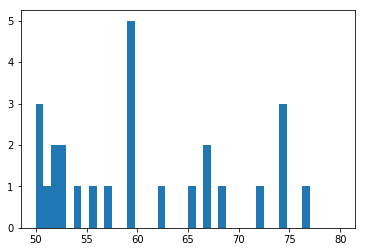

In [47]:
plt.hist( new.purchase_amount, range= [50,80],bins= 40);

In [46]:
new.purchase_amount.nlargest(5)

1676431    263.157498
228412     139.053747
893769      97.009567
1815869     76.682904
250127      74.385651
Name: purchase_amount, dtype: float64

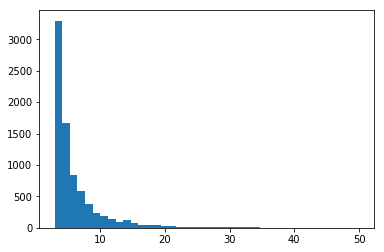

In [51]:
plt.hist( new.purchase_amount, range= [3,50],bins= 40);

In [53]:
his[:2]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.703331,2017-06-25 15:33:07,1.0,16,37
1,Y,C_ID_4e6213e9bc,88,N,0,A,367,M_ID_86ec983688,-7,-0.733128,2017-07-15 12:10:45,1.0,16,16


In [54]:
bb-b

set()

In [58]:
len(b-bb)

35539

In [59]:
bbb= set(train.card_id)

In [60]:
len(bbb-(b-bb))

179986

In [62]:
len(bbb)-179986

21931

In [83]:
his[his.city_id==-1].merchant_id.unique()

array(['M_ID_7c5e93af2f', 'M_ID_98b342c0e3', nan, ..., 'M_ID_2965a409b0',
       'M_ID_ac1f2081e7', 'M_ID_514e67a176'], dtype=object)

In [84]:
mer[mer.merchant_id=='M_ID_7c5e93af2f']

,merchant_id,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,category_1,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id,state_id,category_2
334646,M_ID_7c5e93af2f,35,683,34,99.488169,99.180807,N,A,A,1.12,1.12513,3,1.18,1.183983,6,1.21,1.202197,12,N,-1,9,1.0


In [112]:
print( (mer.numerical_1==-1).sum())
mer.loc[ (mer.numerical_1<0) & (mer.numerical_1>-1)].numerical_1.unique()
mer.loc[ (mer.numerical_1<1) & (mer.numerical_1>0)].numerical_1.unique()

0


array([0.40852985, 0.00201877, 0.01193368, 0.04167839, 0.91418997,
       0.03176349, 0.02184858, 0.0615082 , 0.11108272, 0.15074234,
       0.08133801, 0.13091253, 0.05159329, 0.99350921, 0.25980629,
       0.0714231 , 0.53742361, 0.10116782, 0.14082743, 0.27963609,
       0.38870004, 0.20031686, 0.19040196, 0.16065724, 0.12099763,
       0.61674284, 0.18048705, 0.09125291, 0.32921062, 0.23997648,
       0.21023176, 0.37878514, 0.41844476, 0.22014667, 0.26972119,
       0.31929571, 0.35895533, 0.289551  , 0.46801928, 0.17057215,
       0.23006157, 0.44818947, 0.36887023, 0.24989138, 0.49776399,
       0.78529622, 0.5076789 , 0.45810437, 0.2994659 , 0.56716832,
       0.34904043, 0.39861495, 0.80512603, 0.55725342, 0.5175938 ,
       0.77538131, 0.9736794 , 0.42835966, 0.58699813, 0.33912552,
       0.48784909, 0.43827456, 0.81504093, 0.63657265, 0.59691303,
       0.69606208, 0.79521112, 0.65640246, 0.88444526, 0.60682794,
       0.30938081, 0.47793418, 0.83487074, 0.68614717, 0.95384

In [93]:
(mer.category_4=='N').sum(),(mer.category_4=='Y').sum()

(238596, 96100)

In [89]:
his[:2]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.703331,2017-06-25 15:33:07,1.0,16,37
1,Y,C_ID_4e6213e9bc,88,N,0,A,367,M_ID_86ec983688,-7,-0.733128,2017-07-15 12:10:45,1.0,16,16


In [94]:
(new.category_1=='Y').sum(),(new.category_1=='N').sum()

(63096, 1899935)

In [116]:
bv=his.sort_values('purchase_amount', ascending= False)
bv

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
29050360,N,C_ID_3b6ac8e52d,69,N,0,A,683,M_ID_ee49262ab5,-3,6.010604e+06,2017-04-23 06:58:58,1.0,9,34
19745877,N,C_ID_5643cd48de,272,N,0,A,703,M_ID_e0cfe8c8e5,-1,1.652987e+05,2017-10-26 13:37:12,1.0,9,29
20537106,N,C_ID_bf460be950,87,N,1,B,166,M_ID_be9d815654,-12,1.472606e+05,2017-02-24 12:07:25,3.0,11,29
28417440,N,C_ID_c9a8dc2e32,20,N,0,A,309,M_ID_1c93af935a,-9,1.382450e+05,2017-02-25 09:29:43,3.0,19,21
24263772,N,C_ID_7d394c4bc0,46,N,0,A,108,M_ID_6af581e72e,-7,1.357661e+05,2017-07-22 16:31:19,3.0,19,34
12097071,N,C_ID_69317a1c08,291,N,0,A,299,M_ID_39772933b9,-4,1.352415e+05,2017-10-21 00:00:00,1.0,9,41
22562437,N,C_ID_37f5285802,296,N,1,B,278,M_ID_39f181f670,-2,1.347588e+05,2017-12-31 09:59:56,1.0,15,37
24641886,N,C_ID_56cd2cfd99,158,N,0,A,518,M_ID_76af620569,-7,1.277315e+05,2017-07-13 14:07:16,1.0,15,27
10018048,N,C_ID_39f02c4538,69,N,1,B,454,M_ID_800c9d11e3,0,1.202151e+05,2018-02-02 13:03:11,1.0,9,39
19397260,N,C_ID_a19c81dda8,232,N,0,A,108,M_ID_8caf862908,-9,1.199196e+05,2017-05-20 09:46:32,4.0,13,34


In [191]:
mer[:2]

,merchant_id,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,category_1,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id,state_id,category_2
0,M_ID_838061e48c,8353,792,9,-0.057471,-0.057471,N,E,E,-0.40,9.666667,3,-2.25,18.666667,6,-2.32,13.916667,12,N,242,9,1.0
1,M_ID_9339d880ad,3184,840,20,-0.057471,-0.057471,N,E,E,-0.72,1.750000,3,-0.74,1.291667,6,-0.57,1.687500,12,N,22,16,1.0


In [194]:
his.loc[his.merchant_id=='M_ID_9339d880ad']

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range
4033265,Y,C_ID_61633eccfb,22,N,0,A,320,M_ID_9339d880ad,-12,-0.720010,2017-02-08 16:48:47,1.0,16,7,E
10148055,Y,C_ID_0ca21b1d04,22,N,1,B,840,M_ID_9339d880ad,-5,-0.626696,2017-09-28 16:58:09,1.0,16,20,E
16721159,Y,C_ID_6a75617049,22,N,3,C,320,M_ID_9339d880ad,-11,-0.183414,2017-02-15 10:26:11,1.0,16,7,E


In [122]:
his.loc[ his.card_id.isin(train.loc[ train.target>5].card_id.values[:10])]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
8469472,Y,C_ID_2fa52141dc,69,N,0,A,356,M_ID_27be76a31c,-10,-0.733835,2017-01-21 11:10:10,1.0,9,21
8469473,Y,C_ID_2fa52141dc,69,N,0,A,222,M_ID_8a0539299e,-2,-0.720822,2017-09-06 11:11:10,1.0,9,21
8469474,N,C_ID_2fa52141dc,69,N,0,A,506,M_ID_40d340dabb,-1,-0.596643,2017-10-23 18:43:09,1.0,9,30
8469475,Y,C_ID_2fa52141dc,69,N,0,A,278,M_ID_57eb30da39,-9,-0.695818,2017-02-07 13:54:41,1.0,9,37
8469476,Y,C_ID_2fa52141dc,69,N,0,A,278,M_ID_01d89fa7da,-8,-0.709342,2017-03-10 15:50:21,1.0,9,37
8469477,Y,C_ID_2fa52141dc,69,N,0,A,80,M_ID_5ba019a379,-3,-0.703331,2017-08-05 13:53:37,1.0,9,37
8469478,Y,C_ID_2fa52141dc,69,N,0,A,705,M_ID_5c55ab6e99,-10,-0.723451,2017-01-17 17:09:40,1.0,9,33
8469479,Y,C_ID_2fa52141dc,69,N,0,A,80,M_ID_c03b62d83d,-9,-0.712497,2017-02-27 11:48:57,1.0,9,37
8469480,Y,C_ID_2fa52141dc,69,N,0,A,80,M_ID_5ba019a379,-8,-0.725871,2017-03-30 16:27:50,1.0,9,37
8469481,Y,C_ID_2fa52141dc,69,N,0,A,554,M_ID_f4508b3ebd,-3,-0.220980,2017-08-14 16:06:35,1.0,9,25


In [123]:
his.loc[ his.card_id.isin(train.loc[ train.target<-5].card_id.values[:10])]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
4017659,N,C_ID_671bb26007,87,N,1,B,705,M_ID_e6acdf6220,-2,-0.694435,2017-11-18 18:10:24,3.0,11,33
4017660,Y,C_ID_671bb26007,87,N,2,C,443,M_ID_547038eab8,-1,-0.690108,2017-12-02 11:36:52,3.0,11,21
4017661,Y,C_ID_671bb26007,87,N,2,C,443,M_ID_547038eab8,-2,-0.673368,2017-11-26 13:57:23,3.0,11,21
4017662,Y,C_ID_671bb26007,87,N,1,B,705,M_ID_e6acdf6220,-12,-0.667568,2017-01-27 21:35:19,3.0,11,33
4017663,Y,C_ID_671bb26007,-1,Y,1,B,755,M_ID_57df19bf28,0,-0.709342,2018-01-28 05:06:05,NaN,-1,8
4017664,Y,C_ID_671bb26007,87,N,2,C,705,M_ID_e6acdf6220,-8,-0.643826,2017-05-27 10:23:58,3.0,11,33
4017665,Y,C_ID_671bb26007,87,N,2,C,705,M_ID_e6acdf6220,-9,-0.641301,2017-04-23 12:13:49,3.0,11,33
4017666,Y,C_ID_671bb26007,87,N,1,B,705,M_ID_e6acdf6220,-1,-0.659454,2017-12-12 08:31:55,3.0,11,33
4017667,Y,C_ID_671bb26007,87,N,2,C,705,M_ID_e6acdf6220,-11,-0.654375,2017-02-25 09:42:59,3.0,11,33
4017668,Y,C_ID_671bb26007,87,N,1,B,705,M_ID_a0ca5ad907,-10,-0.644803,2017-03-18 11:48:42,3.0,11,33


In [124]:
new.loc[ new.card_id.isin(train.loc[ train.target<-5].card_id.values[:10])]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
944988,Y,C_ID_8186f3fcc1,149,N,1,B,367,NaN,1,-0.701828,2018-03-10 22:51:58,5.0,20,16
944989,Y,C_ID_8186f3fcc1,149,N,1,B,80,M_ID_fbaae334f0,2,-0.682594,2018-04-23 20:55:01,5.0,20,37
944990,Y,C_ID_8186f3fcc1,149,N,1,B,560,M_ID_b55158e29e,2,-0.701152,2018-04-07 11:26:11,5.0,20,34
944991,Y,C_ID_8186f3fcc1,149,N,1,B,130,M_ID_b3dc59a9a9,1,-0.709342,2018-03-08 08:49:23,5.0,20,41
944992,Y,C_ID_8186f3fcc1,288,N,1,B,80,M_ID_2d22260d5e,1,-0.695818,2018-03-16 20:37:22,5.0,20,37
944993,Y,C_ID_8186f3fcc1,288,N,1,B,278,M_ID_38fe25e4d6,1,-0.725811,2018-03-16 21:12:20,5.0,20,37
944994,Y,C_ID_8186f3fcc1,149,N,1,B,793,M_ID_7013d59cef,1,-0.694315,2018-03-16 05:38:58,5.0,20,38
944995,Y,C_ID_8186f3fcc1,149,N,1,B,705,M_ID_b42048a5e3,1,-0.732197,2018-03-05 14:22:03,5.0,20,33
944996,Y,C_ID_8186f3fcc1,288,N,1,B,432,M_ID_137fc5640c,1,-0.506784,2018-03-16 17:31:37,5.0,20,27
944997,Y,C_ID_8186f3fcc1,56,N,1,B,307,M_ID_94ae90b0af,1,-0.441329,2018-03-23 17:08:22,5.0,20,19


In [196]:
new.loc[ new.card_id.isin(train.loc[ train.target>5].card_id.values[:10])]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range
286503,Y,C_ID_d2df3c5c60,149,N,2,C,87,M_ID_81292e5f0b,2,-0.619002,2018-03-12 12:28:30,5.0,20,27,D
1787195,Y,C_ID_bcfdafdb04,68,N,1,B,80,M_ID_dcf6d9f16f,2,-0.592886,2018-04-15 17:20:27,1.0,16,37,C
1804176,Y,C_ID_0dea332d6c,322,N,1,B,511,NaN,2,-0.743902,2018-04-27 09:19:00,3.0,11,7,NaN
1925969,Y,C_ID_8fc73d1ef2,271,N,0,A,884,M_ID_0c502d5e66,2,-0.731881,2018-04-11 12:23:11,1.0,9,27,B
1951485,Y,C_ID_856221c39e,69,N,0,A,307,M_ID_5dc55673fc,2,-0.731881,2018-04-10 15:02:27,1.0,9,19,B
1992685,Y,C_ID_2fa52141dc,69,N,0,A,108,M_ID_8fcb16a959,1,-0.737892,2017-12-19 16:14:17,1.0,9,34,A


In [126]:
his.loc[ his.card_id.isin(train.loc[ train.target<-5].card_id.values[:10])].groupby(['card_id','merchant_id']).purchase_amount.size()

card_id          merchant_id    
C_ID_26364d47bb  M_ID_3244e548e4      1
                 M_ID_36065f64c5      4
                 M_ID_48068ddc8b      1
                 M_ID_83f5481387      1
                 M_ID_8d67c181ba      1
                 M_ID_9f26996178      1
                 M_ID_e31347350b      1
                 M_ID_eb501732fe      2
C_ID_42421ac52e  M_ID_00a6ca8a8a      3
                 M_ID_00ad2b9f6f     20
                 M_ID_1025b02fd3      2
                 M_ID_1037b30551      1
                 M_ID_108fe639ff      1
                 M_ID_10e4a1af78      1
                 M_ID_127941aa58      1
                 M_ID_22db8513e4      1
                 M_ID_244d90a12a      3
                 M_ID_2c98dbd7d8      1
                 M_ID_2da30dd32e      1
                 M_ID_3117062634      1
                 M_ID_3eacad1192      5
                 M_ID_4679ed517b      1
                 M_ID_4a1c89009a      1
                 M_ID_4f37c3e65a      3
       

In [128]:
new[new.card_id=='C_ID_c4262c902e']

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
1932298,Y,C_ID_c4262c902e,-1,Y,2,C,879,M_ID_00a6ca8a8a,1,-0.619333,2017-08-03 17:31:42,NaN,-1,29


In [207]:
his.loc[ his.card_id.isin(train.loc[train.target.isin(train.target.nlargest(100))].card_id)].sort_values(['card_id','merchant_category_id','merchant_id','purchase_date'])

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range
29305372,Y,C_ID_01064bd867,69,N,0,A,80,M_ID_5ba019a379,-7,-0.668770,2017-02-25 23:40:56,1.0,9,37,A
29305379,Y,C_ID_01064bd867,69,N,0,A,278,M_ID_b47411819b,-2,-0.423432,2017-07-16 14:30:51,1.0,9,37,D
29305373,Y,C_ID_01064bd867,193,N,0,A,422,M_ID_d83784b923,-2,-0.618506,2017-07-30 15:32:11,1.0,15,27,D
29305369,Y,C_ID_01064bd867,193,N,0,A,437,M_ID_d329f496af,-1,-0.724759,2017-08-30 16:42:43,1.0,15,15,B
29305380,Y,C_ID_01064bd867,69,N,0,A,560,M_ID_940fb4498f,-7,-0.712347,2017-02-26 12:26:11,1.0,9,34,A
29305370,Y,C_ID_01064bd867,69,N,0,A,560,M_ID_c6a54fcf89,-7,-0.714210,2017-02-28 17:48:23,1.0,9,34,D
29305371,Y,C_ID_01064bd867,322,N,0,A,705,M_ID_4269871309,-6,-0.081834,2017-03-16 12:03:31,3.0,11,33,A
29305375,Y,C_ID_01064bd867,322,N,0,A,705,M_ID_6514aabcb0,-6,-0.560504,2017-03-27 11:44:52,3.0,11,33,D
29305376,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-7,-0.613908,2017-02-04 17:31:43,1.0,9,33,B
29305383,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-7,-0.528032,2017-02-27 10:51:11,1.0,9,33,B


In [202]:
new.loc[ new.card_id.isin(train.loc[train.target.isin(train.target.nlargest(100))].card_id)].sort_values(['card_id','merchant_category_id','merchant_id'])

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range
1955128,Y,C_ID_01064bd867,193,N,0,A,690,M_ID_6e1c46d10b,2,-0.740957,2017-11-25 18:28:24,1.0,15,1,C
1697285,Y,C_ID_0af57a636a,-1,Y,1,B,879,M_ID_b9dcf28cb9,1,-0.746156,2017-11-19 18:18:12,NaN,-1,29,A
1295119,Y,C_ID_0b51d7f942,-1,Y,0,A,661,M_ID_fc7d7969c3,2,-0.746893,2018-04-07 14:19:32,NaN,-1,8,A
1973569,Y,C_ID_0d8592d3eb,69,N,0,A,690,M_ID_c34a4e9746,1,-0.741664,2017-11-04 19:22:09,1.0,9,1,C
1689155,Y,C_ID_124906b84a,69,N,1,B,842,M_ID_1d8085cf5d,1,-0.711595,2018-02-02 12:49:16,1.0,9,37,A
1055906,Y,C_ID_12cef6ff40,169,N,1,B,683,M_ID_3b4bcf92ac,1,-0.716915,2017-07-01 11:46:15,5.0,20,34,E
1770744,Y,C_ID_1a91747ced,4,N,0,A,690,M_ID_dc29578342,2,-0.740897,2017-11-07 23:07:06,2.0,10,1,B
1843699,Y,C_ID_1b28c8af6b,-1,Y,0,A,661,M_ID_fc7d7969c3,2,-0.746893,2018-04-18 15:10:11,NaN,-1,8,A
1914444,Y,C_ID_1c8a5b9d44,212,N,1,B,427,M_ID_32e96ddff1,2,-0.746893,2018-04-30 12:11:04,4.0,4,27,B
1978007,Y,C_ID_1d876fab0f,-1,Y,1,B,879,M_ID_b9dcf28cb9,1,-0.746156,2018-01-16 10:56:28,NaN,-1,29,A


In [218]:
his.loc[ his.card_id.isin(train.loc[train.target.isin(train.target.nlargest(100))].card_id)].sort_values(['card_id','merchant_category_id','merchant_id','month_lag'])

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range,category_4
31722214,Y,C_ID_01064bd867,69,N,0,A,80,M_ID_5ba019a379,-7,-0.668770,2017-02-25 23:40:56,1.0,9,37,A,Y
31722221,Y,C_ID_01064bd867,69,N,0,A,278,M_ID_b47411819b,-2,-0.423432,2017-07-16 14:30:51,1.0,9,37,D,Y
31722215,Y,C_ID_01064bd867,193,N,0,A,422,M_ID_d83784b923,-2,-0.618506,2017-07-30 15:32:11,1.0,15,27,D,N
31722211,Y,C_ID_01064bd867,193,N,0,A,437,M_ID_d329f496af,-1,-0.724759,2017-08-30 16:42:43,1.0,15,15,B,N
31722222,Y,C_ID_01064bd867,69,N,0,A,560,M_ID_940fb4498f,-7,-0.712347,2017-02-26 12:26:11,1.0,9,34,A,Y
31722212,Y,C_ID_01064bd867,69,N,0,A,560,M_ID_c6a54fcf89,-7,-0.714210,2017-02-28 17:48:23,1.0,9,34,D,Y
31722213,Y,C_ID_01064bd867,322,N,0,A,705,M_ID_4269871309,-6,-0.081834,2017-03-16 12:03:31,3.0,11,33,A,N
31722217,Y,C_ID_01064bd867,322,N,0,A,705,M_ID_6514aabcb0,-6,-0.560504,2017-03-27 11:44:52,3.0,11,33,D,N
31722218,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-7,-0.613908,2017-02-04 17:31:43,1.0,9,33,B,Y
31722225,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-7,-0.528032,2017-02-27 10:51:11,1.0,9,33,B,Y


In [217]:
his.loc[ his.card_id.isin(train.loc[train.target.isin(train.loc[ train.target>-20].target.nsmallest(100))].card_id)].sort_values(['card_id','merchant_category_id','merchant_id','month_lag'])

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range,category_4
14140424,Y,C_ID_019f58d716,333,N,0,A,34,M_ID_e71031acf9,-8,0.064524,2017-06-03 12:18:36,1.0,9,38,D,N
14140554,Y,C_ID_019f58d716,333,N,0,A,80,M_ID_98b342c0e3,-8,-0.672527,2017-06-03 13:44:18,1.0,9,37,A,N
14140472,Y,C_ID_019f58d716,333,N,0,A,108,M_ID_03e9eda8f2,-4,-0.714300,2017-10-01 15:54:48,1.0,9,34,E,N
14140493,Y,C_ID_019f58d716,-1,N,0,A,360,M_ID_030e215be0,-3,-0.742415,2017-11-17 00:00:00,NaN,-1,34,D,N
14140510,Y,C_ID_019f58d716,-1,N,0,A,360,M_ID_030e215be0,-3,-0.736389,2017-11-22 00:00:00,NaN,-1,34,D,N
14140455,Y,C_ID_019f58d716,333,N,0,A,367,M_ID_6f3a85d0af,-9,-0.728921,2017-05-08 20:22:25,1.0,9,16,B,N
14140527,Y,C_ID_019f58d716,-1,N,0,A,367,M_ID_6f3a85d0af,-1,-0.731491,2018-01-20 18:15:35,NaN,-1,16,B,N
14140501,Y,C_ID_019f58d716,333,N,0,A,367,M_ID_8402682d1b,-2,-0.737727,2017-12-03 08:35:35,1.0,9,16,C,N
14140536,Y,C_ID_019f58d716,333,N,0,A,422,M_ID_ad36f69fa9,-8,-0.625193,2017-06-03 17:38:19,1.0,9,27,C,N
14140491,Y,C_ID_019f58d716,333,N,0,A,422,M_ID_ad36f69fa9,-4,-0.626711,2017-10-02 19:01:03,1.0,9,27,C,N


In [138]:
#train.loc[ train.target>-20].target.nsmallest(100)
new.loc[ new.card_id.isin(train.loc[train.target.isin(train.loc[ train.target>-20].target.nsmallest(100))].card_id)]

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id
63617,Y,C_ID_2db6dabf76,57,N,0,A,80,M_ID_2852b60e55,1,-0.733384,2018-03-22 14:27:39,5.0,5,37
63618,Y,C_ID_2db6dabf76,143,N,0,A,506,M_ID_a9d91682ad,1,-0.641872,2018-03-22 08:24:59,5.0,5,30
63619,Y,C_ID_2db6dabf76,57,N,0,A,690,M_ID_f95833eb95,2,0.079550,2018-04-07 08:45:06,5.0,5,1
63620,Y,C_ID_2db6dabf76,57,N,0,A,705,M_ID_66007a92d4,2,-0.700401,2018-04-12 11:19:30,5.0,5,33
63621,Y,C_ID_2db6dabf76,57,N,0,A,195,M_ID_296e94fa1f,1,-0.705735,2018-03-28 14:14:43,5.0,5,34
63622,Y,C_ID_2db6dabf76,57,N,0,A,705,M_ID_a96b79ead7,2,-0.466769,2018-04-10 18:59:17,5.0,5,33
63623,Y,C_ID_2db6dabf76,57,N,0,A,206,M_ID_dc4daf8557,2,-0.725871,2018-04-11 08:20:20,5.0,5,1
63624,Y,C_ID_2db6dabf76,57,N,0,A,419,M_ID_85ba042a08,2,-0.623871,2018-04-14 13:20:49,5.0,5,1
63625,Y,C_ID_2db6dabf76,57,N,0,A,544,M_ID_d51c85ff83,2,-0.713038,2018-04-12 14:32:53,5.0,5,29
63626,Y,C_ID_2db6dabf76,57,N,0,A,419,M_ID_ead14bbae3,1,-0.725194,2018-03-23 12:04:25,5.0,5,1


In [146]:
train.loc[ train.card_id.isin( new.loc[new.purchase_amount>10].card_id)]

,first_active_month,card_id,feature_1,feature_2,feature_3,target
38,2015-11,C_ID_8ffb6daff8,5,1,1,-0.565065
342,2016-12,C_ID_734044eeeb,1,3,0,0.006187
576,2016-12,C_ID_0cb44a170d,1,1,0,-0.704209
670,2017-09,C_ID_bf83c4f289,4,1,0,-5.141876
786,2017-08,C_ID_f3552cca35,1,1,0,0.059000
857,2017-07,C_ID_9275642211,1,1,0,-1.356442
1357,2017-10,C_ID_338e086c18,1,1,0,-1.346496
1561,2017-07,C_ID_74d44b6653,4,1,0,-0.680328
1677,2017-08,C_ID_693285242b,1,1,0,-0.412379
1898,2017-01,C_ID_f86560619c,1,3,0,-3.277976


In [147]:
train.loc[ train.card_id.isin( his.loc[his.purchase_amount>10].card_id)]

,first_active_month,card_id,feature_1,feature_2,feature_3,target
38,2015-11,C_ID_8ffb6daff8,5,1,1,-0.565065
73,2016-12,C_ID_e58112a217,3,1,1,-1.724547
124,2016-07,C_ID_e41d01e0f8,5,2,1,0.117132
282,2015-07,C_ID_7c341c1897,5,1,1,0.664130
320,2017-06,C_ID_ca2968ed7d,4,1,0,2.455097
340,2017-06,C_ID_9d105ef026,5,2,1,1.050544
343,2016-05,C_ID_6b73d521bd,5,1,1,-0.590518
385,2016-11,C_ID_133ea909ff,1,3,0,0.192794
446,2017-07,C_ID_cc1d24c817,4,2,0,0.393409
559,2017-10,C_ID_5d928c021c,2,1,0,0.699717


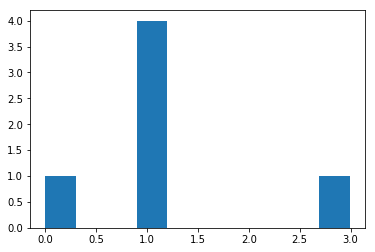

In [170]:
plt.hist(mer.groupby('most_recent_sales_range').avg_purchases_lag12.mean());

In [177]:
mer.groupby('most_recent_sales_range').size()

most_recent_sales_range
0         3
A      1005
B      5037
C     34075
D    117475
E    177101
dtype: int64

In [189]:
his.loc[his.card_id.isin(train.loc[train.target.isin(train.target.nlargest(100))].card_id)].sort_values(['card_id','merchant_id','most_recent_sales_range'])

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range
29305368,Y,C_ID_01064bd867,69,N,0,A,771,M_ID_0fcd8521ec,-1,-0.636914,2017-08-20 16:29:33,1.0,9,31,A
29305374,Y,C_ID_01064bd867,69,N,0,A,771,M_ID_0fcd8521ec,-1,-0.636914,2017-08-12 17:29:05,1.0,9,31,A
29305371,Y,C_ID_01064bd867,322,N,0,A,705,M_ID_4269871309,-6,-0.081834,2017-03-16 12:03:31,3.0,11,33,A
29305372,Y,C_ID_01064bd867,69,N,0,A,80,M_ID_5ba019a379,-7,-0.668770,2017-02-25 23:40:56,1.0,9,37,A
29305375,Y,C_ID_01064bd867,322,N,0,A,705,M_ID_6514aabcb0,-6,-0.560504,2017-03-27 11:44:52,3.0,11,33,D
29305367,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-2,-0.214594,2017-07-08 13:17:12,1.0,9,33,B
29305376,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-7,-0.613908,2017-02-04 17:31:43,1.0,9,33,B
29305377,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-1,-0.616012,2017-08-12 15:23:39,1.0,9,33,B
29305378,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-6,-0.658732,2017-03-31 20:16:24,1.0,9,33,B
29305381,Y,C_ID_01064bd867,69,N,0,A,705,M_ID_7dcc819fa3,-6,-0.458684,2017-03-31 15:09:11,1.0,9,33,B


In [188]:
new.loc[ new.card_id.isin(train.loc[train.target.isin(train.loc[ train.target>-20].target.nsmallest(100))].card_id)].sort_values('most_recent_sales_range')

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range
1753261,Y,C_ID_83f5258285,291,N,0,A,511,M_ID_9139332ccc,1,-0.468917,2018-03-24 15:59:08,1.0,9,7,A
591592,Y,C_ID_6793df4f49,69,N,1,B,879,M_ID_00a6ca8a8a,1,-0.641722,2017-06-08 10:56:08,1.0,9,29,A
593066,Y,C_ID_11f626f71a,279,N,1,B,705,M_ID_87c8e4b8c0,1,-0.577544,2017-08-30 15:39:51,1.0,9,33,A
593067,Y,C_ID_11f626f71a,-1,Y,1,B,302,M_ID_b9f9332438,1,-0.578987,2017-08-18 19:36:33,NaN,-1,22,A
593069,Y,C_ID_11f626f71a,-1,Y,8,C,690,M_ID_3111c6df35,2,3.114876,2017-09-08 12:33:12,NaN,-1,1,A
593070,Y,C_ID_11f626f71a,143,N,2,C,506,M_ID_a9d91682ad,1,-0.616327,2017-08-17 16:21:56,5.0,5,30,A
593071,Y,C_ID_11f626f71a,279,N,1,B,19,M_ID_166881ab3f,1,-0.603284,2017-08-24 15:32:11,1.0,9,36,A
659789,Y,C_ID_be00169aa9,51,N,0,A,705,M_ID_865c0a082c,1,-0.712542,2017-10-30 22:53:49,1.0,16,33,A
1757105,Y,C_ID_22588d6bcd,69,N,1,B,879,M_ID_00a6ca8a8a,2,-0.536537,2017-10-05 13:37:31,1.0,9,29,A
723676,Y,C_ID_241f0b32e7,69,N,0,A,879,M_ID_00a6ca8a8a,1,-0.716855,2018-01-16 23:02:41,1.0,9,29,A


In [180]:
his= pd.merge(his, mer.loc[:,['merchant_id','most_recent_sales_range']], on='merchant_id', how= 'left')
new= pd.merge(new, mer.loc[:,['merchant_id','most_recent_sales_range']], on='merchant_id', how= 'left')

In [215]:
mer.loc[ mer.city_id==-1]

,merchant_id,merchant_group_id,merchant_category_id,subsector_id,numerical_1,numerical_2,category_1,most_recent_sales_range,most_recent_purchases_range,avg_sales_lag3,avg_purchases_lag3,active_months_lag3,avg_sales_lag6,avg_purchases_lag6,active_months_lag6,avg_sales_lag12,avg_purchases_lag12,active_months_lag12,category_4,city_id,state_id,category_2
2,M_ID_e726bbae1e,447,690,1,-0.057471,-0.057471,N,E,E,-82.13,260.000000,2,-82.13,260.000000,2,-82.13,260.000000,2,N,-1,5,5.0
3,M_ID_a70e9c5f81,5026,792,9,-0.057471,-0.057471,Y,E,E,NaN,1.666667,3,NaN,4.666667,6,NaN,3.833333,12,Y,-1,-1,NaN
4,M_ID_64456c37ce,2228,222,21,-0.057471,-0.057471,Y,E,E,NaN,0.500000,3,NaN,0.361111,6,NaN,0.347222,12,Y,-1,-1,NaN
7,M_ID_d8ff08219e,16430,529,20,-0.057471,-0.057471,Y,E,E,NaN,1.000000,3,NaN,1.666667,6,NaN,1.500000,11,Y,-1,-1,NaN
9,M_ID_d2162ed113,112122,81,29,-0.057471,-0.057471,Y,E,E,NaN,1.000000,2,NaN,1.000000,2,NaN,1.000000,2,Y,-1,-1,NaN
14,M_ID_c9eb20f6f5,25449,45,18,-0.057471,-0.057471,N,E,E,NaN,1.666667,3,NaN,1.666667,3,NaN,1.666667,3,N,-1,16,1.0
15,M_ID_c9855bf3e3,321,690,1,-0.057471,-0.057471,Y,E,E,NaN,1084.000000,3,NaN,3432.666667,6,NaN,5236.000000,12,Y,-1,-1,NaN
16,M_ID_c929bb59af,9514,2,20,-0.057471,-0.057471,N,E,E,69667.00,1.000000,3,69667.00,1.000000,3,69667.00,1.000000,3,N,-1,20,5.0
20,M_ID_a8effe9197,577,497,27,-0.057471,-0.057471,N,E,E,3897.00,1.333333,3,2924.00,1.250000,4,2924.00,1.250000,4,N,-1,16,1.0
21,M_ID_39643c7d93,22146,309,21,-0.057471,-0.057471,N,E,E,608433.00,5.666667,3,776683.00,7.000000,6,749804.00,6.000000,12,N,-1,16,1.0


In [216]:
his= pd.merge(his, mer.loc[:,['merchant_id','category_4']], on='merchant_id', how= 'left')
new= pd.merge(new, mer.loc[:,['merchant_id','category_4']], on='merchant_id', how= 'left')

In [241]:
his.loc[his.card_id.isin(train.loc[train.target<-30].card_id)].sort_values(['card_id','merchant_id','most_recent_sales_range'])

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range,category_4
29395699,Y,C_ID_001982552a,69,N,1,B,879,M_ID_00a6ca8a8a,-2,-0.731881,2017-08-06 13:49:39,1.0,9,29,A,Y
29395700,Y,C_ID_001982552a,69,N,1,B,879,M_ID_00a6ca8a8a,-2,-0.731881,2017-08-06 13:49:39,1.0,9,29,A,Y
29395697,Y,C_ID_001982552a,69,N,1,B,879,M_ID_00a6ca8a8a,-2,-0.731881,2017-08-06 13:49:39,1.0,9,29,E,Y
29395698,Y,C_ID_001982552a,69,N,1,B,879,M_ID_00a6ca8a8a,-2,-0.731881,2017-08-06 13:49:39,1.0,9,29,E,Y
29395681,Y,C_ID_001982552a,158,N,1,B,683,M_ID_00f86a4171,-2,-0.709732,2017-08-23 12:03:15,1.0,15,34,D,Y
29395726,Y,C_ID_001982552a,158,N,1,B,683,M_ID_00f86a4171,-2,-0.688380,2017-08-08 10:14:54,1.0,15,34,D,Y
29395707,Y,C_ID_001982552a,158,N,1,B,278,M_ID_0d0e81f4be,-8,-0.659754,2017-02-12 21:27:23,1.0,15,37,D,Y
29395671,Y,C_ID_001982552a,158,N,1,B,80,M_ID_1ac6bbc867,-8,-0.624877,2017-02-08 11:57:17,1.0,15,37,A,Y
29395674,Y,C_ID_001982552a,158,N,1,B,80,M_ID_1ac6bbc867,-2,-0.725871,2017-08-06 14:22:47,1.0,15,37,A,Y
29395680,Y,C_ID_001982552a,158,N,1,B,80,M_ID_1ac6bbc867,-2,-0.725871,2017-08-06 13:57:16,1.0,15,37,A,Y


In [242]:
his.loc[his.card_id.isin(train.loc[train.target<-30].card_id)].groupby('category_4').size()

category_4
N     71541
Y    130309
dtype: int64

In [252]:
his.purchase_date=pd.to_datetime( his.purchase_date).dt.date
new.purchase_date=pd.to_datetime( new.purchase_date).dt.date

In [254]:
his.groupby(['card_id','subsector_id','purchase_date']).size()

card_id          subsector_id  purchase_date
C_ID_00007093c1  1             2017-08-05       1
                               2018-02-07       3
                 8             2017-04-17       2
                               2017-06-14       2
                               2017-07-03       1
                               2017-07-06       1
                               2017-07-14       1
                               2017-07-31       1
                               2017-08-01       2
                               2017-08-07       1
                               2017-08-14       1
                               2017-08-22       1
                               2017-09-04       1
                               2017-09-08       1
                               2017-10-01       1
                               2017-10-02       2
                               2017-10-19       1
                               2017-10-28       1
                               2017-11-01       1
     

In [255]:
his.groupby(['card_id','subsector_id','purchase_date']).size().reset_index()

,card_id,subsector_id,purchase_date,0
0,C_ID_00007093c1,1,2017-08-05,1
1,C_ID_00007093c1,1,2018-02-07,3
2,C_ID_00007093c1,8,2017-04-17,2
3,C_ID_00007093c1,8,2017-06-14,2
4,C_ID_00007093c1,8,2017-07-03,1
5,C_ID_00007093c1,8,2017-07-06,1
6,C_ID_00007093c1,8,2017-07-14,1
7,C_ID_00007093c1,8,2017-07-31,1
8,C_ID_00007093c1,8,2017-08-01,2
9,C_ID_00007093c1,8,2017-08-07,1


In [261]:
his.groupby(['card_id','subsector_id','purchase_date']).size().reset_index().groupby('subsector_id')[0].nlargest().reset_index()

,subsector_id,level_1,0
0,-1,1426463,9
1,-1,20003271,8
2,-1,20786072,8
3,-1,4156126,6
4,-1,16404940,6
5,1,3294519,63
6,1,12995556,49
7,1,5013028,48
8,1,12995561,48
9,1,11675944,35


In [262]:
his

,authorized_flag,card_id,city_id,category_1,installments,category_3,merchant_category_id,merchant_id,month_lag,purchase_amount,purchase_date,category_2,state_id,subsector_id,most_recent_sales_range,category_4
0,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-8,-0.703331,2017-06-25,1.0,16,37,A,Y
1,Y,C_ID_4e6213e9bc,88,N,0,A,367,M_ID_86ec983688,-7,-0.733128,2017-07-15,1.0,16,16,A,Y
2,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_979ed661fc,-6,-0.720386,2017-08-09,1.0,16,37,C,Y
3,Y,C_ID_4e6213e9bc,88,N,0,A,560,M_ID_e6d5ae8ea6,-5,-0.735352,2017-09-02,1.0,16,34,D,Y
4,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_e020e9b302,-11,-0.722865,2017-03-10,1.0,16,37,A,Y
5,Y,C_ID_4e6213e9bc,333,N,0,A,80,M_ID_50af771f8d,0,-0.734887,2018-02-24,1.0,9,37,B,N
6,Y,C_ID_4e6213e9bc,88,N,0,A,278,M_ID_5e8220e564,-11,-0.716855,2017-03-21,1.0,16,37,A,Y
7,Y,C_ID_4e6213e9bc,3,N,0,A,80,M_ID_9d41786a50,-3,-0.657049,2017-11-18,1.0,16,37,C,N
8,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_979ed661fc,-8,-0.737967,2017-06-01,1.0,16,37,C,Y
9,Y,C_ID_4e6213e9bc,88,N,0,A,80,M_ID_74ba14b5fc,-11,-0.715352,2017-03-16,1.0,16,37,D,Y
